## Purpose of the notebook ####

In this notebook we try to pair the subclones previously identified in 1_ with the TME composition near each subclone. For this, we associate each subclone with their closest TME cells

### Read packages

In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import infercnvpy as cnv
import squidpy as sq

/home/sergio/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/sergio/.local/lib/python3.10/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/home/sergio/.local/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


# Read adata

In [2]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
adata_epi=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_correct_neighbors_200_cnvinfered_epithelial.h5ad')

In [4]:
freqs=adata_epi.obs.groupby('cnv_epi').count()

/tmp/ipykernel_1941363/821235554.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  freqs=adata_epi.obs.groupby('cnv_epi').count()


In [10]:
freqs.div(freqs.sum(axis=0),axis=1)

,cell_id,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method,region,z_level,cell_labels,n_genes,n_counts,leiden,cell class,cnv_leiden
cnv_epi,,,,,,,,,,,,,,,,,,,,
0,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.379878,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240,0.375240
1,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.318656,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677,0.323677
2,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.132356,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625,0.131625
3,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.115841,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344,0.116344
4,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038424,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853,0.038853
5,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009794,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369,0.009369
6,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.005052,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890,0.004890


In [11]:
0.03+0.009+0.004

0.043

# Read full dataset

In [3]:
adata=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_correct_neighbors_200_cnvinfered.h5ad')

In [4]:
adata_tme=adata[adata.obs['cell class']!='Epithelial']

In [5]:
del adata

We compute the distance from each non-malignant cell to the closest malignant cell

In [6]:
adata_tme.obs['X']=[a[0] for a in adata_tme.obsm['spatial']]
adata_tme.obs['Y']=[a[1] for a in adata_tme.obsm['spatial']]
adata_epi.obs['X']=[a[0] for a in adata_epi.obsm['spatial']]
adata_epi.obs['Y']=[a[1] for a in adata_epi.obsm['spatial']]

/tmp/ipykernel_1186082/2193737192.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_tme.obs['X']=[a[0] for a in adata_tme.obsm['spatial']]


In [ ]:
from tqdm import tqdm

adata_tme.obs['closest_malignant']='nan'
adata_tme.obs['distance_to_malignant']='nan'
for rd in tqdm(adata_tme.obs.index):
    meas=((adata_epi.obs.X-adata_tme.obs.loc[rd,'X'])**2)+((adata_epi.obs.Y-adata_tme.obs.loc[rd,'Y'])**2)
    adata_tme.obs.loc[rd,'closest_malignant']=meas.idxmin()
    adata_tme.obs.loc[rd,'distance_to_malignant']=np.sqrt(np.min(meas))


 79%|██████████████████████████████████████████████████████████▋               | 472703/596084 [51:13<13:14, 155.29it/s]

In [ ]:
cell_to_celltype=dict(zip(adata_epi.obs.index,adata_epi.obs['cnv_leiden']))
cell_to_cnvepi=dict(zip(adata_epi.obs.index,adata_epi.obs['cnv_epi']))

In [ ]:
adata_tme.obs['closest_subclone']=list(adata_tme.obs['closest_malignant'].map(cell_to_celltype))
adata_tme.obs['closest_subclone_epi']=list(adata_tme.obs['closest_malignant'].map(cell_to_cnvepi))


In [ ]:
cnv.tl.pca(adata_epi)
cnv.pp.neighbors(adata_epi)
cnv.tl.leiden(adata_epi,resolution=0.2,key_added='cnv_epi')
sc.tl.dendrogram(adata_epi,groupby='cnv_epi')
sc.pl.dendrogram(adata_epi,groupby='cnv_epi')

In [ ]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.spatial(adata_epi,color='cnv_epi',spot_size=50,frameon=False,show=False)
plt.savefig(saving_path+'/spatial_cnv_epi_correct.pdf')

In [ ]:
adata_tme.obs['distance_to_malignant']=adata_tme.obs['distance_to_malignant'].astype(float)

In [ ]:
adata_tme.write('/media/sergio/Ymir/5kovarian_for_cnv/adata_tme_ovarian_with_distances_correct.h5ad')

In [19]:
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
adata_tme=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_tme_ovarian_with_distances_correct.h5ad')

# Analysis of tme

We select only cells that are present close to malignant cells, which we define as the close tme

In [51]:
adata_tme=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_tme_ovarian_with_distances_3.h5ad')

In [18]:
adata_tme.shape

(596084, 4993)

In [20]:
close_tme=adata_tme[adata_tme.obs['distance_to_malignant']<20]

In [21]:
colors=['#d73027', #red
        '#abd9e9', #bu1
        '#fee090', # yl
        '#4575b4', #bu3
        '#f46d43', #or1
        '#e0f3f8',#wh
        '#fdae61', # or2
        '#74add1', # bu2
        ]
close_tme.uns['closest_subclone_epi_colors']=colors


/tmp/ipykernel_1186082/1337129596.py:10: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  close_tme.uns['closest_subclone_epi_colors']=colors


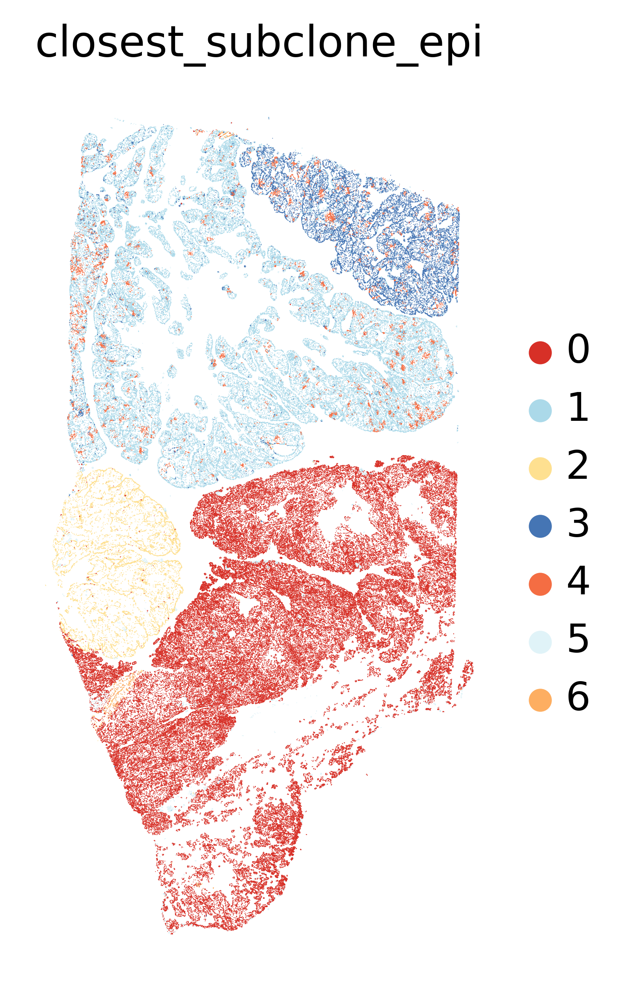

In [22]:
sc.pl.spatial(close_tme,color='closest_subclone_epi',spot_size=20)

In [ ]:
sc.pl.spatial(close_tme,color='leiden',spot_size=20,palette='tab20')

In [52]:
sc.pp.neighbors(close_tme,n_neighbors=8)

/home/sergio/.local/lib/python3.10/site-packages/scipy/sparse/_index.py:145: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [97]:
sc.tl.umap(close_tme,min_dist=0.1)

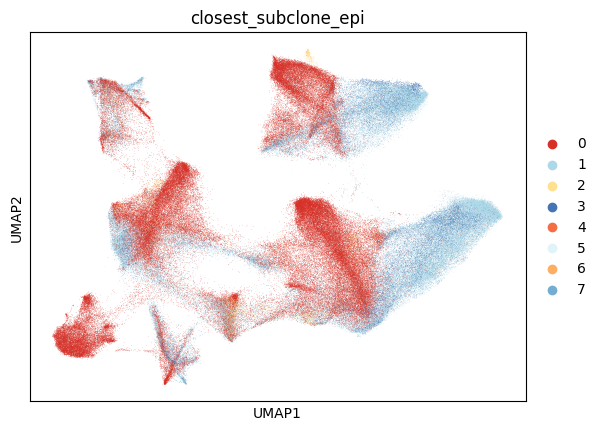

In [98]:
sc.pl.umap(close_tme,color='closest_subclone_epi')

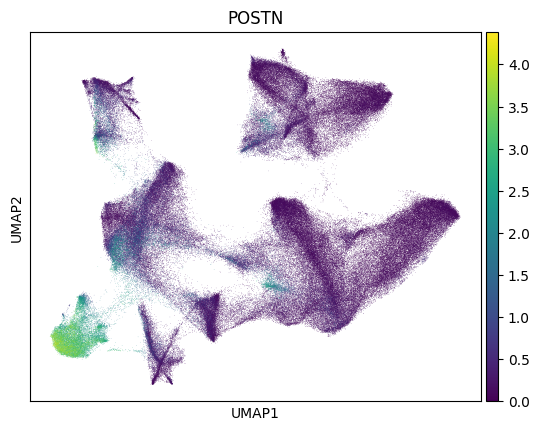

In [100]:
sc.pl.umap(close_tme,color=['POSTN'])

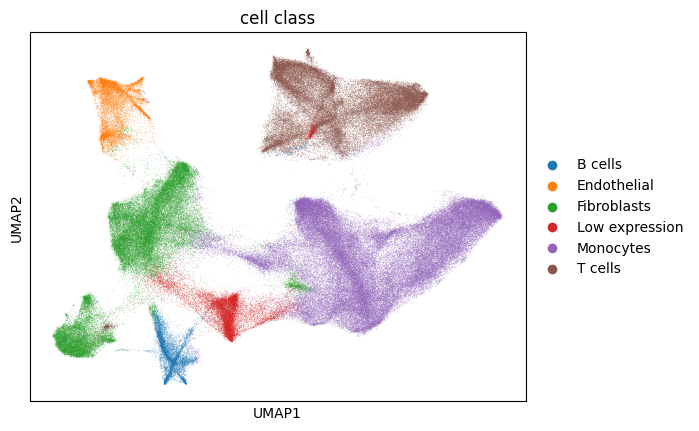

In [99]:
sc.pl.umap(close_tme,color='cell class')

In [ ]:
sc.pl.umap(adata_epi,color=['POSTN','H19'])

In [ ]:
sc.pl.umap(close_tme,color=['POSTN','H19'])

In [ ]:
sc.pl.spatial(close_tme,color='POSTN',spot_size=20,palette='tab20')

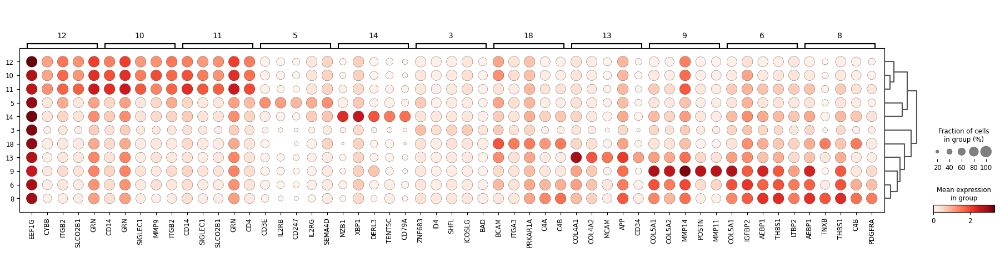

In [90]:
sc.tl.rank_genes_groups(close_tme,groupby='leiden',layer='raw')
sc.tl.dendrogram(close_tme,groupby='leiden')
sc.pl.rank_genes_groups_dotplot(close_tme,groupby='leiden',n_genes=5)
plt.show()

In [23]:
close_tme.write('/media/sergio/Ymir/5kovarian_for_cnv/adata_close_tme_ovarian_correct.h5ad')

In [2]:
close_tme=sc.read('/media/sergio/Ymir/5kovarian_for_cnv/adata_close_tme_ovarian_correct.h5ad')

In [24]:
cmaps=['viridis','jet','plasma','inferno','magma','Greys','Purples','YlGnBu']
colors=['#d73027', #red
        '#abd9e9', #bu1
        '#fee090', # yl
        '#4575b4', #bu3
         '#e0f3f8',#wh
        '#f46d43', #or1
     
        '#fdae61', # or2
        '#74add1', # bu2
        ]
close_tme.uns['closest_subclone_epi_colors']=colors


In [25]:
# Frequency based on distance

Text(0, 0.5, 'Relative frequency')

<Figure size 1500x1500 with 0 Axes>

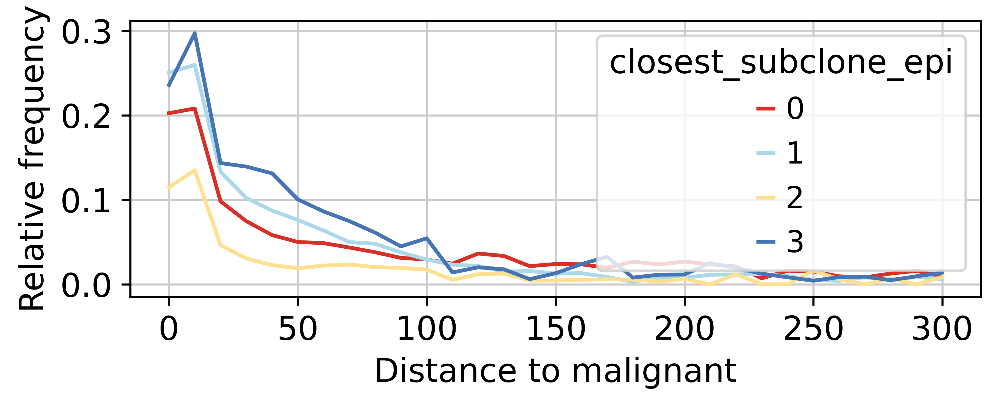

In [26]:
class_selected='T cells'
adata_tme.obs['distance_malignant_round']=adata_tme.obs['distance_to_malignant'].round(-1)
ctb=pd.crosstab(adata_tme.obs['closest_subclone_epi'],adata_tme.obs['distance_malignant_round'])
ctb_sub=ctb.loc[['0','1','2','3'],:]
tcl=adata_tme[adata_tme.obs['cell class']==class_selected]
ctb_tcell=pd.crosstab(tcl.obs['closest_subclone_epi'],tcl.obs['distance_malignant_round'])
ctb_tcell=ctb_tcell.loc[['0','1','2','3'],:]
prop_tcell=ctb_tcell/ctb_sub
plt.figure()
prop_tcell.loc[:,prop_tcell.columns[0:31]].transpose().plot(figsize=(6,2),color=['#d73027','#abd9e9','#fee090', '#4575b4'])
plt.xlabel('Distance to malignant')
plt.ylabel('Relative frequency')

Text(0, 0.5, 'Relative frequency')

<Figure size 3000x600 with 0 Axes>

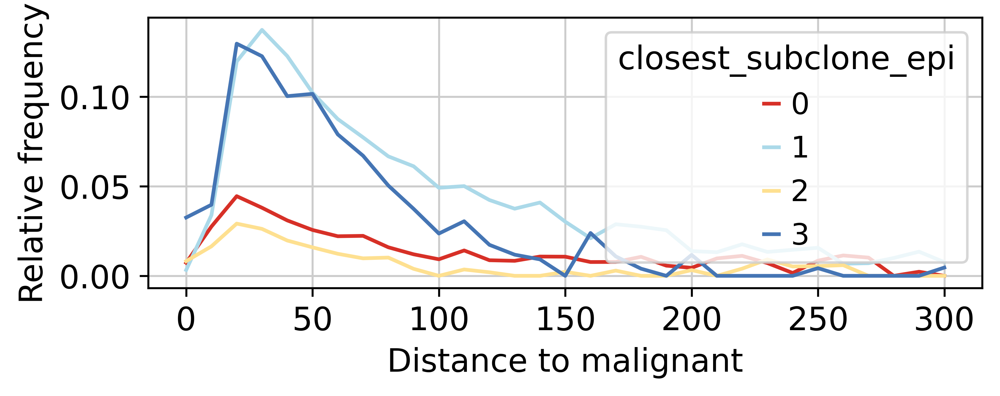

In [27]:
class_selected='B cells'
adata_tme.obs['distance_malignant_round']=adata_tme.obs['distance_to_malignant'].round(-1)
ctb=pd.crosstab(adata_tme.obs['closest_subclone_epi'],adata_tme.obs['distance_malignant_round'])
ctb_sub=ctb.loc[['0','1','2','3'],:]
tcl=adata_tme[adata_tme.obs['cell class']==class_selected]
ctb_tcell=pd.crosstab(tcl.obs['closest_subclone_epi'],tcl.obs['distance_malignant_round'])
ctb_tcell=ctb_tcell.loc[['0','1','2','3'],:]
prop_bcell=ctb_tcell/ctb_sub
plt.figure(figsize=(10,2))
prop_bcell.loc[:,prop_bcell.columns[0:31]].transpose().plot(figsize=(6,2),color=['#d73027','#abd9e9','#fee090', '#4575b4'])
plt.xlabel('Distance to malignant')
plt.ylabel('Relative frequency')

Text(0, 0.5, 'Relative frequency')

<Figure size 1500x1500 with 0 Axes>

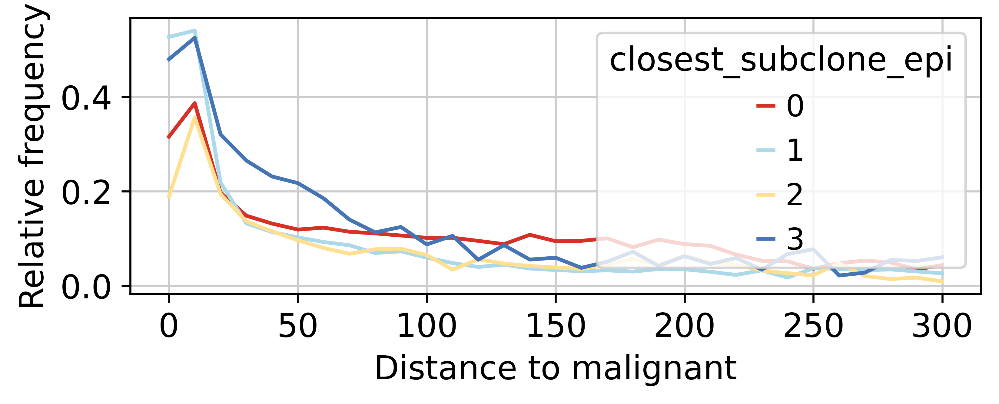

In [28]:
class_selected='Monocytes'
adata_tme.obs['distance_malignant_round']=adata_tme.obs['distance_to_malignant'].round(-1)
ctb=pd.crosstab(adata_tme.obs['closest_subclone_epi'],adata_tme.obs['distance_malignant_round'])
ctb_sub=ctb.loc[['0','1','2','3'],:]
tcl=adata_tme[adata_tme.obs['cell class']==class_selected]
ctb_tcell=pd.crosstab(tcl.obs['closest_subclone_epi'],tcl.obs['distance_malignant_round'])
ctb_tcell=ctb_tcell.loc[['0','1','2','3','4','5','6'],:]
prop_mono=ctb_tcell/ctb_sub
plt.figure()
prop_mono.loc[:,prop_mono.columns[0:31]].transpose().plot(figsize=(6,2),color=['#d73027','#abd9e9','#fee090', '#4575b4'])
plt.xlabel('Distance to malignant')
plt.ylabel('Relative frequency')

Text(0, 0.5, 'Relative frequency')

<Figure size 1500x1500 with 0 Axes>

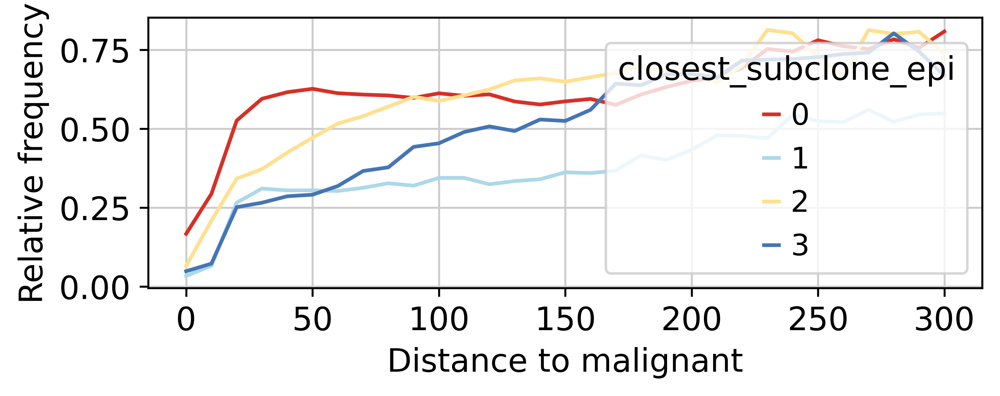

In [29]:
class_selected='Fibroblasts'
adata_tme.obs['distance_malignant_round']=adata_tme.obs['distance_to_malignant'].round(-1)
ctb=pd.crosstab(adata_tme.obs['closest_subclone_epi'],adata_tme.obs['distance_malignant_round'])
ctb_sub=ctb.loc[['0','1','2','3'],:]
tcl=adata_tme[adata_tme.obs['cell class']==class_selected]
ctb_tcell=pd.crosstab(tcl.obs['closest_subclone_epi'],tcl.obs['distance_malignant_round'])
ctb_tcell=ctb_tcell.loc[['0','1','2','3'],:]
prop_fib=ctb_tcell/ctb_sub
plt.figure()
prop_fib.loc[:,prop_fib.columns[0:31]].transpose().plot(figsize=(6,2),color=['#d73027','#abd9e9','#fee090', '#4575b4'])
plt.xlabel('Distance to malignant')
plt.ylabel('Relative frequency')

Text(0, 0.5, 'Relative frequency')

<Figure size 1500x1500 with 0 Axes>

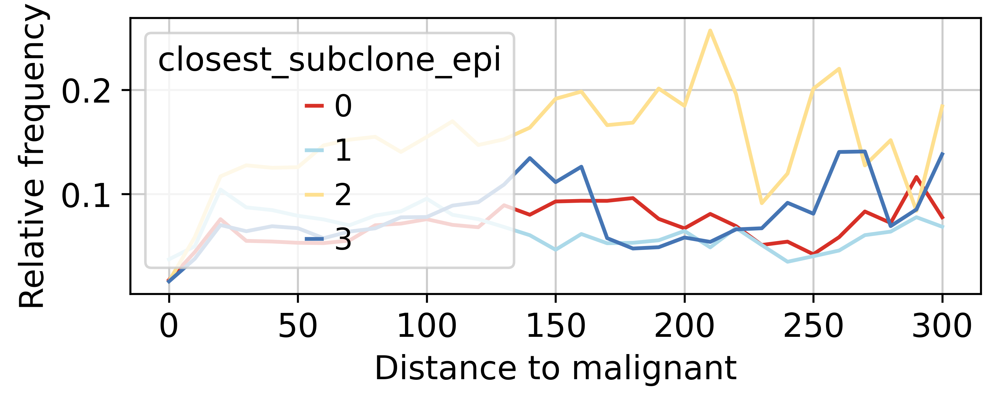

In [30]:
class_selected='Endothelial'
adata_tme.obs['distance_malignant_round']=adata_tme.obs['distance_to_malignant'].round(-1)
ctb=pd.crosstab(adata_tme.obs['closest_subclone_epi'],adata_tme.obs['distance_malignant_round'])
ctb_sub=ctb.loc[['0','1','2','3'],:]
tcl=adata_tme[adata_tme.obs['cell class']==class_selected]
ctb_tcell=pd.crosstab(tcl.obs['closest_subclone_epi'],tcl.obs['distance_malignant_round'])
ctb_tcell=ctb_tcell.loc[['0','1','2','3'],:]
prop_endo=ctb_tcell/ctb_sub
plt.figure()
prop_endo.loc[:,prop_endo.columns[0:31]].transpose().plot(figsize=(6,2),color=['#d73027','#abd9e9','#fee090', '#4575b4'])
plt.xlabel('Distance to malignant')
plt.ylabel('Relative frequency')

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 41 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'B', 'D', 'E', 'F', 'M', 'R', 'S', 'T', 'a', 'b', 'c', 'd', 'e', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'mu', 'n', 'nonmarkingreturn', 'o', 'one', 'parenleft', 'parenright', 'period', 'q', 'r', 's', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 11, 12, 17, 19, 20, 21, 22, 23, 24, 37, 39, 40, 41, 48, 53, 54, 55, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 84, 85, 86, 87, 88, 92, 119]
INFO:fontTools.subset:Closed glyph list over 'MAT

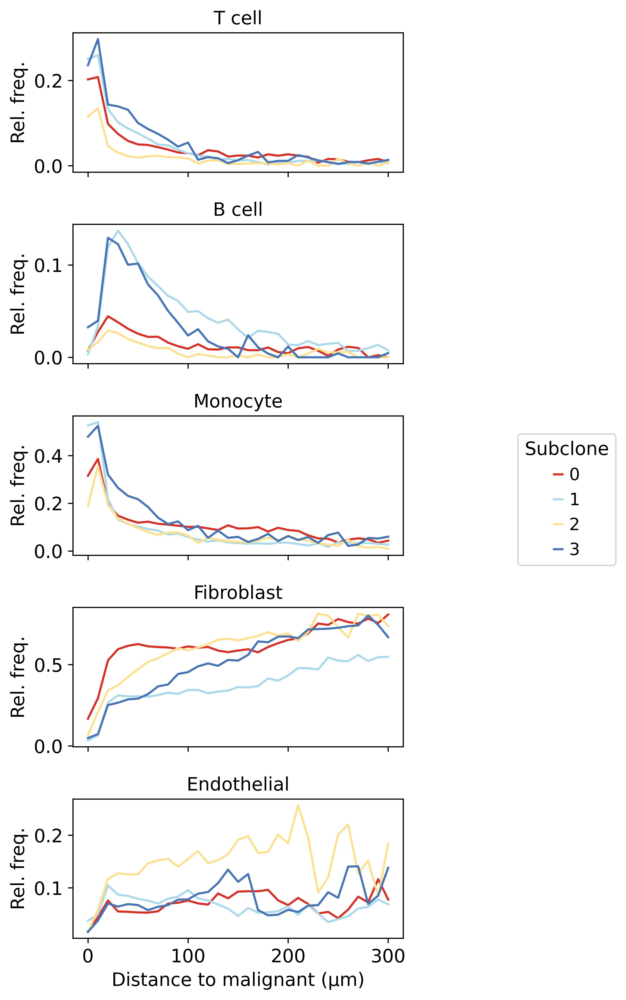

In [31]:
import matplotlib.pyplot as plt
import matplotlib

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, 
                     fontsize=13, figsize=(5,5), color_map=None, format='pdf', 
                     facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
saving_path = '/media/sergio/Ymir/5kovarian_for_cnv/figures'

# Define the cell types and their corresponding data
cell_types = ['T cell', 'B cell', 'Monocyte', 'Fibroblast', 'Endothelial']
dataframes = [prop_tcell, prop_bcell, prop_mono, prop_fib, prop_endo]
colors = ['#d73027', #red
        '#abd9e9', #bu1
        '#fee090', # yl
        '#4575b4', #bu3
        '#f46d43', #or1
        '#e0f3f8',#wh
        '#fdae61', # or2
        '#74add1', # bu2
        ]  # Same color scheme

# Create figure with 5 subplots, sharing the x-axis
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(5, 10), sharex=True)

# Plot each cell type
lines = []  # Store line objects for legend
labels = []  # Store labels for legend

for ax, df, cell_type in zip(axes, dataframes, cell_types):
    df_transposed = df.loc[:, df.columns[0:31]].transpose()
    line_objs = df_transposed.plot(ax=ax, color=colors, grid=False)
    
    # Store one set of legend handles and labels from the first plot
    if not lines:
        lines, labels = ax.get_legend_handles_labels()

    ax.set_ylabel('Rel. freq.')
    ax.set_title(cell_type)
    ax.get_legend().remove()  # Remove individual legends

# Set common x-axis label
axes[-1].set_xlabel('Distance to malignant (µm)')

# Adjust layout for readability
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Make space for legend on the right

# Add global legend outside the plot on the right
fig.legend(lines, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title="Subclone")

# Save and show plot
#plt.savefig(f"{saving_path}/tme_cell_class_by_clone_distance.pdf", bbox_inches='tight')
plt.savefig("tme_cell_class_by_clone_distance_correct.pdf", bbox_inches='tight')
plt.show()


# Distant to malignant

In [32]:
adata_tme_sub=adata_tme[adata_tme.obs['closest_subclone_epi'].isin(['0','1','2','3','4','5','6'])]

In [33]:
adata_tme_sub=adata_tme_sub[adata_tme_sub.obs['distance_to_malignant']<300]

In [41]:
cmaps=['sub1','sub3','sub4','sub5','sub0','sub6','sub2']

In [42]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import seaborn as sns

def get_palette(name="default", n_colors=None):
    """
    """
    palettes = {
        "sub0": ["#D83227", "#99ffc0"],
         "sub1": ["#ADD9E9", "#99ffc0"],
         "sub2": ["#FDDF90", "#99ffc0"],
         "sub3": ["#4676B5", "#99ffc0"],
        "sub4": ['#f46d43', "#99ffc0"],
         "sub5": [ '#e0f3f8', "#99ffc0"],
         "sub6": ['#fdae61', "#99ffc0"],
    }

    palette = palettes[name]
    return palette[:n_colors] if n_colors else palette


def get_colormap(name="default"):
    """
    Returns a continuous colormap for Matplotlib.

    Parameters
    ----------
    - name (str): Name of the colormap ("default", "coolwarm", "viridis", etc.).

    Returns
    -------
    - matplotlib.colors.Colormap object.
    """
    colormaps = {
        "sub0": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub0")),
        "sub1": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub1")),
        "sub2": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub2")),
        "sub3": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub3")),
        "sub4": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub4")),
        "sub5": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub5")),
        "sub6": mcolors.LinearSegmentedColormap.from_list("custom_cmap", get_palette("sub6")),
    }

    if name not in colormaps:
        raise ValueError(f"Colormap '{name}' not found. Available colormaps: {list(colormaps.keys())}")

    return colormaps[name]


In [43]:
adata_tme_sub.obs['closest_subclone_epi'].unique()

['1', '3', '4', '5', '0', '6', '2']
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

/tmp/ipykernel_1186082/2917149659.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
/tmp/ipykernel_1186082/2917149659.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
/tmp/ipykernel_1186082/2917149659.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
/tmp/ipykernel_1186082/2917149659.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
/tmp/ipykernel_1186082/2917149659.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  sub.obs['distanc

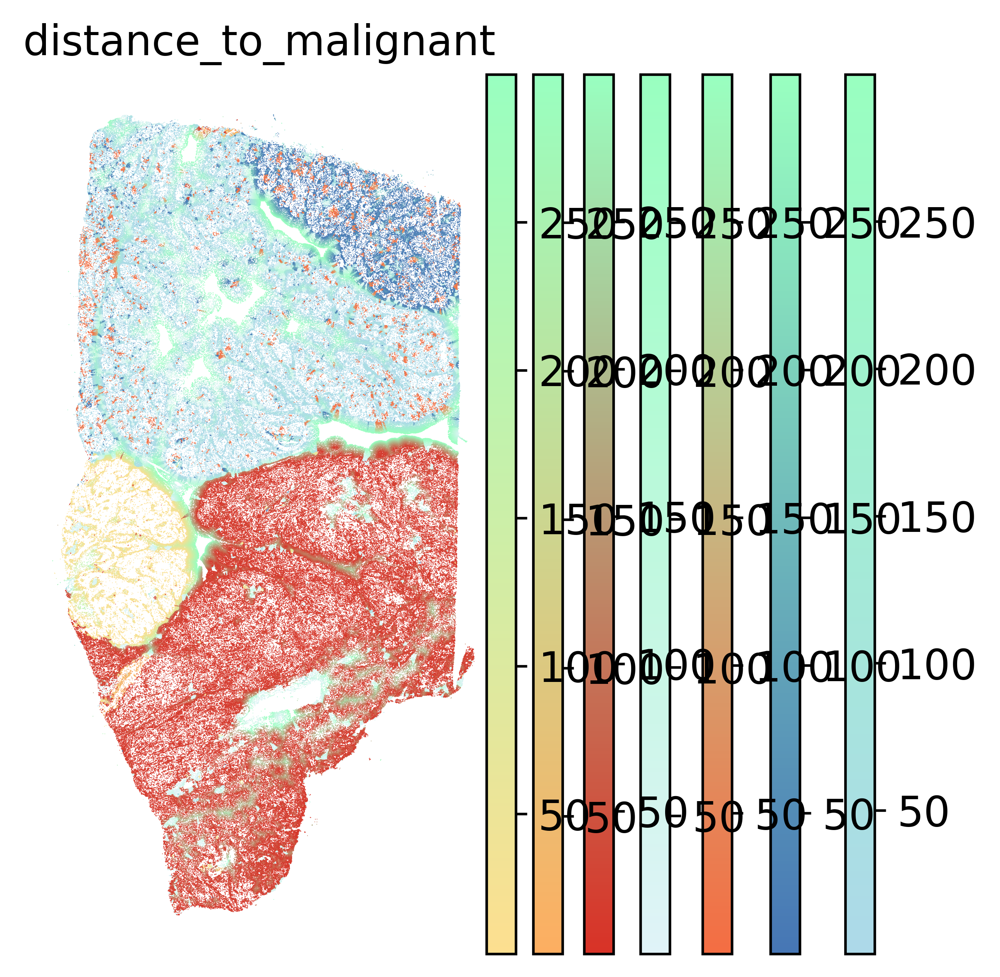

In [44]:
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib.pyplot as plt
import matplotlib

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, 
                     fontsize=13, figsize=(5,5), color_map=None, format='pdf', 
                     facecolor=None, transparent=False, ipython_format='png2x')
fig,ax=plt.subplots()
for i,s in enumerate(adata_tme_sub.obs['closest_subclone_epi'].unique()):
    sub=adata_tme_sub[adata_tme_sub.obs['closest_subclone_epi']==s]
    sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
    sc.pl.spatial(sub,color='distance_to_malignant',cmap=get_colormap(cmaps[i]),show=False,spot_size=20,ax=ax)
    #plt.legend(None)
    
plt.savefig("spatial_tme_by_clone_distance_correct.pdf", bbox_inches='tight')
plt.show()


In [ ]:
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=13, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib.pyplot as plt
import matplotlib

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, 
                     fontsize=13, figsize=(5,5), color_map=None, format='pdf', 
                     facecolor=None, transparent=False, ipython_format='png2x')
fig,ax=plt.subplots()
for i,s in enumerate(adata_tme_sub.obs['closest_subclone_epi'].unique()):
    sub=adata_tme_sub[adata_tme_sub.obs['closest_subclone_epi']==s]
    sub.obs['distance_to_malignant']=sub.obs['distance_to_malignant']
    sc.pl.spatial(sub,color='distance_to_malignant',cmap=get_colormap(cmaps[i]),show=False,spot_size=20,ax=ax)
    #plt.legend(None)
    
plt.savefig("spatial_tme_by_clone_distance_correct.png", bbox_inches='tight')
plt.show()


In [46]:
# in theory positions are in um, according to 10X description of the data

subclone_cellstate=pd.crosstab(close_tme.obs['closest_subclone_epi'],close_tme.obs['cell class']).transpose()
subclone_cellstate=subclone_cellstate.loc[~subclone_cellstate.index.isin(['Low expression']),:]
subclone_cellstate=subclone_cellstate.div(subclone_cellstate.sum(axis=1),axis=0)

In [47]:
subclone_cellstate

closest_subclone_epi,0,1,2,3,4,5,6
cell class,,,,,,,
B cells,0.401272,0.323298,0.018792,0.122850,0.041511,0.090595,0.001683
Endothelial,0.474968,0.303646,0.051797,0.070929,0.026865,0.069262,0.002533
Fibroblasts,0.745803,0.114344,0.040776,0.039032,0.011186,0.046682,0.002176
Monocytes,0.447123,0.339170,0.031408,0.109523,0.051347,0.019167,0.002262
T cells,0.452973,0.313157,0.021754,0.114073,0.075987,0.020171,0.001886


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'MATH': 32 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'B', 'E', 'F', 'M', 'T', 'a', 'b', 'c', 'd', 'e', 'five', 'four', 'h', 'i', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 37, 40, 41, 48, 55, 68, 69, 70, 71, 72, 75, 76, 79, 81, 82, 85, 86, 87, 92]
INFO:fontTools.subset:Closed glyph list over 'MATH': 32 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'B', 'E', 'F', 'M'

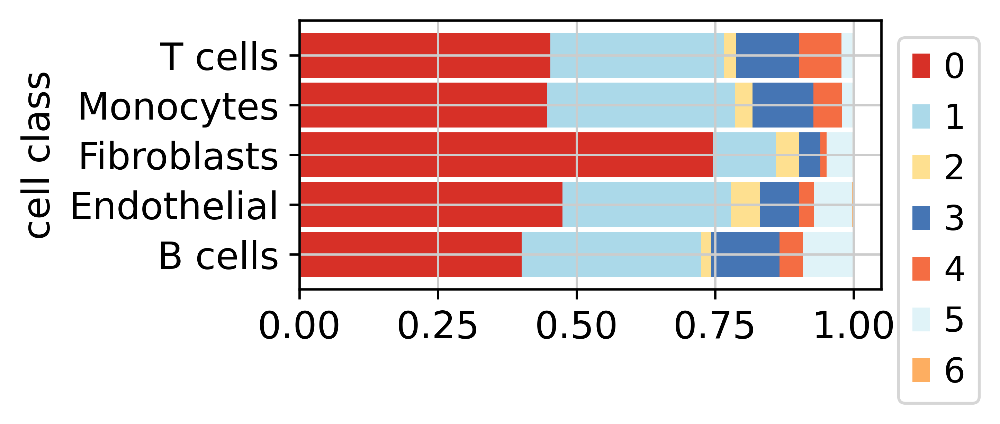

In [48]:
ax=subclone_cellstate.plot(kind='barh',stacked=True,width=0.9,color=colors,figsize=(5,2))
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust layout to prevent cutting off legend
plt.tight_layout()
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
plt.savefig(saving_path+'/tme_cell_class_frequency_by_clone.pdf')
plt.show()

In [49]:
# in theory positions are in um, according to 10X description of the data

subclone_cellstate=pd.crosstab(close_tme.obs['closest_subclone_epi'],close_tme.obs['cell class'])
subclone_cellstate=subclone_cellstate.loc[~subclone_cellstate.index.isin(['Low expression']),:]
subclone_cellstate=subclone_cellstate.div(subclone_cellstate.sum(axis=1),axis=0)

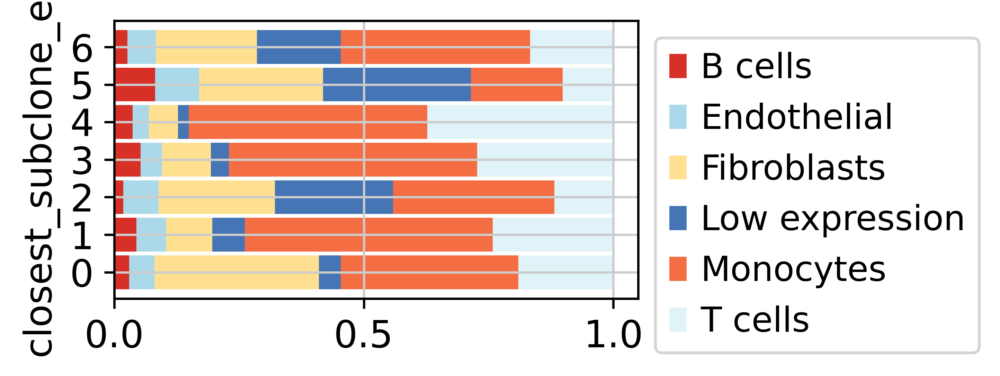

In [50]:
ax=subclone_cellstate.plot(kind='barh',stacked=True,width=0.9,color=colors,figsize=(5,2))
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust layout to prevent cutting off legend
plt.tight_layout()
saving_path='/media/sergio/Ymir/5kovarian_for_cnv/figures'
#plt.savefig(saving_path+'/clone_composition.pdf')
plt.show()

In [ ]:
for ct in close_tme.obs['cell class'].unique():
    try:
        print(ct)
        close_tme_sub=close_tme[close_tme.obs['cell class']==ct]
        sc.tl.rank_genes_groups(close_tme_sub,groupby='closest_subclone_epi')
        sc.pl.rank_genes_groups_dotplot(close_tme_sub,groupby='closest_subclone_epi',n_genes=5)
        plt.show()
    except:
        pass

/home/sergio/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:639: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


In [ ]:
sc.tl.rank_genes_groups(adata,groupby='cnv_leiden')
sc.pl.rank_genes_groups_dotplot(adata,n_genes=15)